In [33]:
# Packages
import warnings
warnings.filterwarnings('ignore')
import json
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import missingno
from pandas_profiling import ProfileReport
import house_prices
import house_prices.adhoc_functions.exploratory as exploratory
%matplotlib inline

In [34]:
# Options
sns.set_style("whitegrid")
pd.set_option('display.max_rows', 200)
pd.set_option('display.max_columns', 100)
pd.set_option('display.width', -1)

In [35]:
linear_data = './data/transformed_data/model_train_linear.csv'
df = pd.read_csv(linear_data)
df = df.reindex(sorted(df.columns), axis=1)
df.head()

,1stFlrSF,2ndFlrSF,BedroomAbvGr,BldgType,BsmtFullBath,BsmtHalfBath,Condition1,CoreArea,ExterCond,ExterGrade,ExterQual,Fireplaces,Foundation,Foundation_ordinal,FullBath,Functional,GarageArea,GarageCars,GrLivArea,HalfBath,HasDeck,HasPool,HasPorch,HeatingQC,HouseStyle,Id,IsCulDeSac,IsNew,IsPartial,IsRemodelled,KitchenAbvGr,KitchenQual,LotArea,LotConfig,LotFrontage,MSSubClass,MSSubClass_ordinal,MSZoning,MasVnrArea,MasVnrType,MasVnrType_ordinal,Neighborhood,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Neighborhood_ordinal,OpenPorchSF,OverallCond,OverallGrade,OverallQual,PoolArea,PropertyAge,SaleCondition,SaleCondition_ordinal,SalePrice,SaleType,SaleType_ordinal,Stories,TotRmsAbvGrd,TotalArea,TotalBath,TotalBsmtSF,WoodDeckSF,YearBuilt,YearRemodAdd,YrSold
0,0.405678,0.914135,0.375,1Fam,1,0,Norm,0.625138,0.5,0.409091,0.736966,0.000000,PConc,1.000000,0.500000,Typ,0.871552,0.50,0.645722,0.25,0,0,1,1.00,2Story,1,0,0,0,1,0.333333,0.666667,0.596529,Inside,0.728713,60,1.000000,RL,0.864618,BrkFace,1.0,CollgCr,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.708333,4.127134,0.500,0.382022,0.666667,0.0,0.036765,Normal,0.5,208500,Deed,0.333333,1.0,0.454545,0.679145,0.5,0.836537,0.000000,0.949275,0.883333,0.50
1,0.594802,0.000000,0.375,1Fam,0,1,Feedr,0.617017,0.5,0.272727,0.415037,0.333333,CBlock,0.666667,0.333333,Typ,0.847414,0.50,0.501615,0.25,1,0,0,1.00,1Story,2,0,0,0,1,0.333333,0.333333,0.637203,FR2,0.764333,20,0.714286,RL,0.000000,None,0.5,Veenker,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0.750000,0.000000,0.875,0.528090,0.555556,0.0,0.227941,Normal,0.5,181500,Deed,0.333333,0.5,0.272727,0.615521,0.3,0.884574,5.700444,0.753623,0.433333,0.25
2,0.440801,0.916023,0.375,1Fam,1,0,Norm,0.651280,0.5,0.409091,0.736966,0.333333,PConc,1.000000,0.500000,Typ,0.885882,0.50,0.666352,0.25,0,0,1,1.00,2Story,3,0,0,0,0,0.333333,0.666667,0.687762,Inside,0.736444,60,1.000000,RL,0.850215,BrkFace,1.0,CollgCr,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.708333,3.761200,0.500,0.382022,0.666667,0.0,0.051471,Normal,0.5,223500,Deed,0.333333,1.0,0.272727,0.704908,0.5,0.845458,0.000000,0.934783,0.866667,0.50
3,0.462042,0.897651,0.375,1Fam,1,0,Norm,0.606971,0.5,0.272727,0.415037,0.333333,BrkTil,0.333333,0.333333,Typ,0.893388,0.75,0.647660,0.00,0,0,1,0.75,2Story,4,0,0,0,0,0.333333,0.666667,0.635539,Corner,0.715010,70,0.642857,RL,0.000000,None,0.5,Crawfor,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.791667,3.583519,0.500,0.382022,0.666667,0.0,0.669118,Abnorml,0.0,140000,Deed,0.333333,1.0,0.363636,0.668524,0.2,0.821168,0.000000,0.311594,0.333333,0.00
4,0.547394,0.942469,0.500,1Fam,1,0,Norm,0.755314,0.5,0.409091,0.736966,0.333333,PConc,1.000000,0.500000,Typ,0.929819,0.75,0.764831,0.25,1,0,1,1.00,2Story,5,0,0,0,1,0.333333,0.666667,0.763341,FR2,0.772717,60,1.000000,RL,0.905990,BrkFace,1.0,NoRidge,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0.958333,4.442651,0.500,0.438202,0.777778,0.0,0.058824,Normal,0.5,250000,Deed,0.333333,1.0,0.545455,0.814630,0.5,0.872532,5.262690,0.927536,0.833333,0.50


In [36]:
keep_vars = [
    'SalePrice',            # Target
    'OverallQual',          # 0.8
    'ExterQual',            # 0.7
    'YearBuilt',            # 0.5
    'YearRemodAdd',         # 0.5
    'MasVnrArea',           # 0.5
    'TotalBsmtSF',          # 0.6
    '1stFlrSF',             # 0.6
    'GrLivArea',            # 0.7
    'FullBath',             # 0.6
    'KitchenQual',          # 0.7
    'TotRmsAbvGrd',         # 0.5
    'Fireplaces',           # 0.5
    'GarageCars',           # 0.6
    'GarageArea',           # 0.6
    'PropertyAge',          #-0.5
    'TotalBath',            # 0.6
    'HasPorch',             # 0.4
    'HeatingQC',            # 0.4
    'TotalArea',            # 0.8
    'CoreArea',             # 0.8
    'Neighborhood_ordinal', # 0.7
    'MSSubClass_ordinal',   # 0.5
    'MasVnrType_ordinal',   # 0.4
    'Foundation_ordinal',   # 0.5 
    'SaleType_ordinal',     # 0.4
    'SaleCondition_ordinal',# 0.3
]

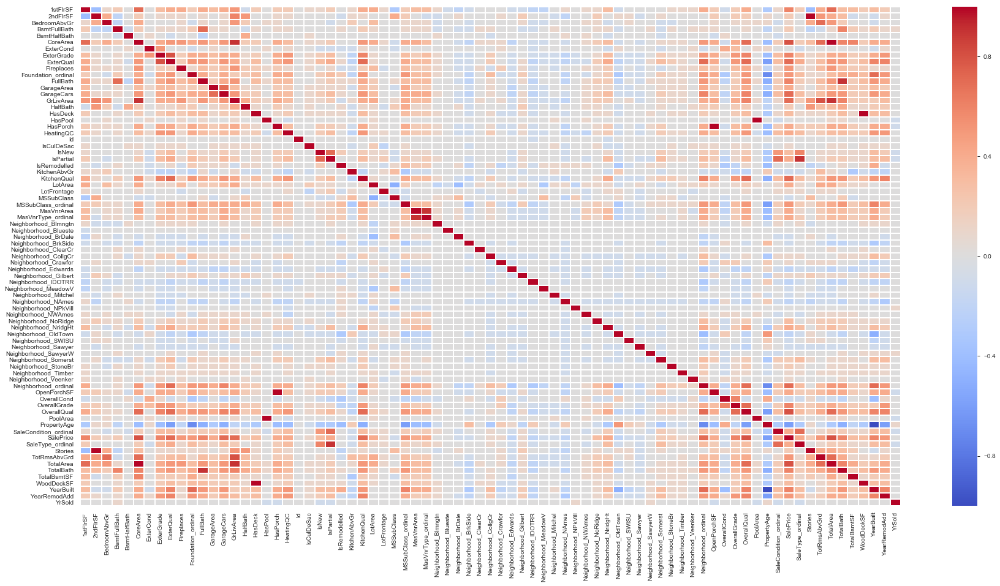

In [37]:
df_corr = exploratory.correlation_heatmap(df, annot=False)

In [38]:
ProfileReport(df[keep_vars],correlation_threshold=1)

Number of variables,27
Number of observations,1430
Total Missing (%),0.0%
Total size in memory,301.7 KiB
Average record size in memory,216.1 B
Numeric,26
Categorical,0
Boolean,1
Date,0
Text (Unique),0
Rejected,0


In [39]:
sns.set(font_scale=8)
pairplot1 = sns.pairplot(
    data=df[[
    'SalePrice',            # Target
#     'OverallQual',          # 0.8
#     'ExterQual',            # 0.7
#     'YearBuilt',            # 0.5
#     'YearRemodAdd',         # 0.5
#     'MasVnrArea',           # 0.5
#     'TotalBsmtSF',          # 0.6
#     '1stFlrSF',             # 0.6
#     'GrLivArea',            # 0.7
    'TotRmsAbvGrd',         # 0.5
    'GarageArea',           # 0.6
    'TotalBath',            # 0.6
    'Neighborhood_ordinal', # 0.7
    'MSSubClass_ordinal',   # 0.5
    'Foundation_ordinal',   # 0.5 
]],
    diag_kind='kde',
    kind="reg",
    height=20
)

In [9]:
sns.set(font_scale=8)
pairplot1 = sns.pairplot(
    data=df[[
    'SalePrice',            # Target
    'OverallQual',          # 0.8
    'ExterQual',            # 0.7
    'YearBuilt',            # 0.5
    'YearRemodAdd',         # 0.5
    'MasVnrArea',           # 0.5
    'TotalBsmtSF',          # 0.6
    '1stFlrSF',             # 0.6
    'GrLivArea',            # 0.7
#     'TotRmsAbvGrd',         # 0.5
#     'GarageArea',           # 0.6
#     'TotalBath',            # 0.6
#     'Neighborhood_ordinal', # 0.7
#     'MSSubClass_ordinal',   # 0.5
#     'Foundation_ordinal',   # 0.5 
]],
    diag_kind='kde',
    kind="reg",
    height=20
)

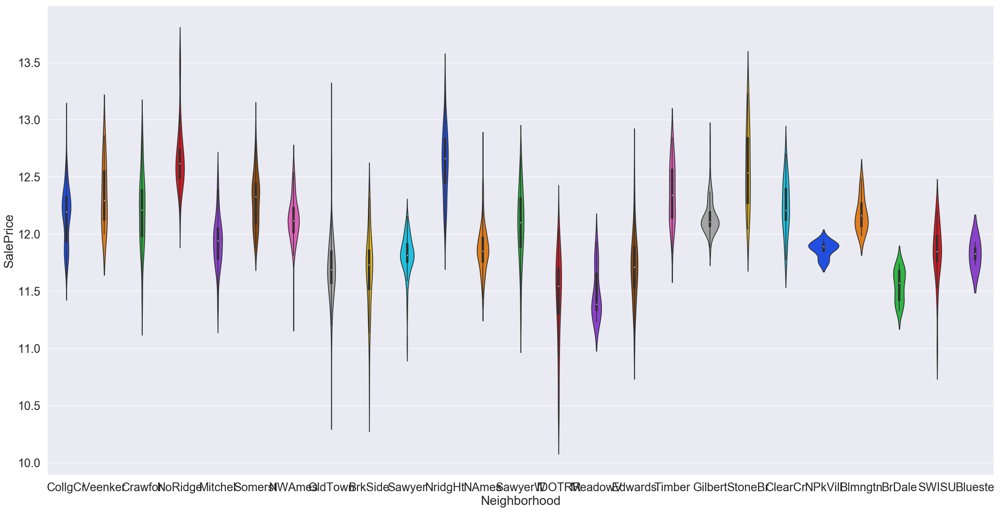

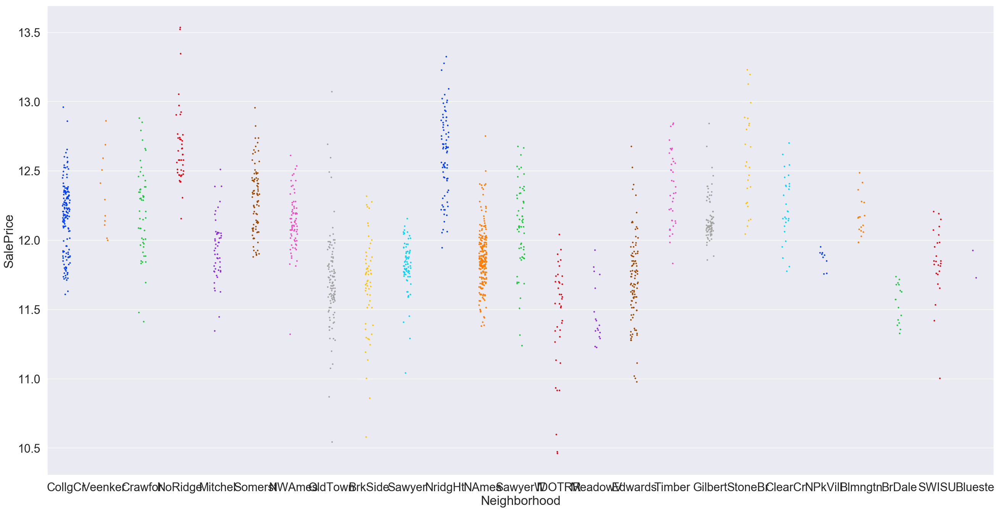

In [10]:
tb = exploratory.explore_feature(df, 'Neighborhood', 'SalePrice', font_scale=2)

In [ ]:
tb_hue = exploratory.explore_feature_hue(df, 'Neighborhood', 'SalePrice', 'CoreArea', palette='bright')

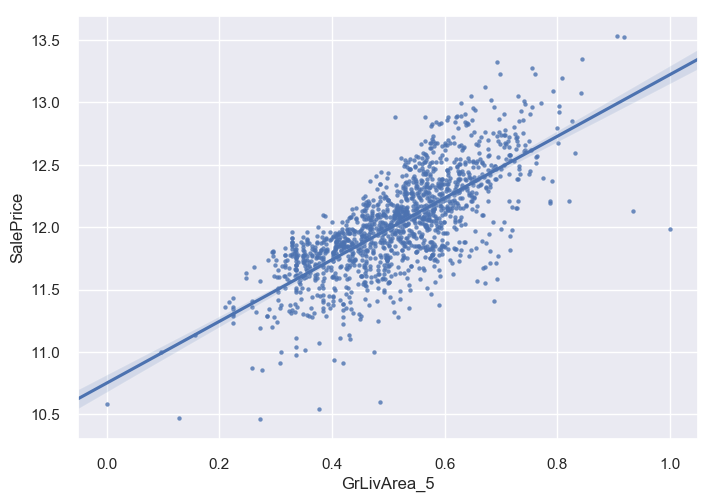

In [12]:
ax = sns.regplot(x='GrLivArea_5', y='SalePrice', data=df, scatter_kws={"s": 10})

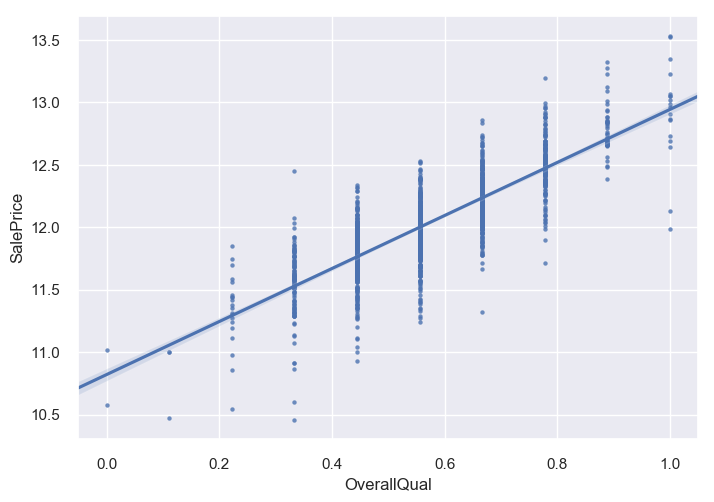

In [13]:
ax = sns.regplot(x='OverallQual', y='SalePrice', data=df, scatter_kws={"s": 10})

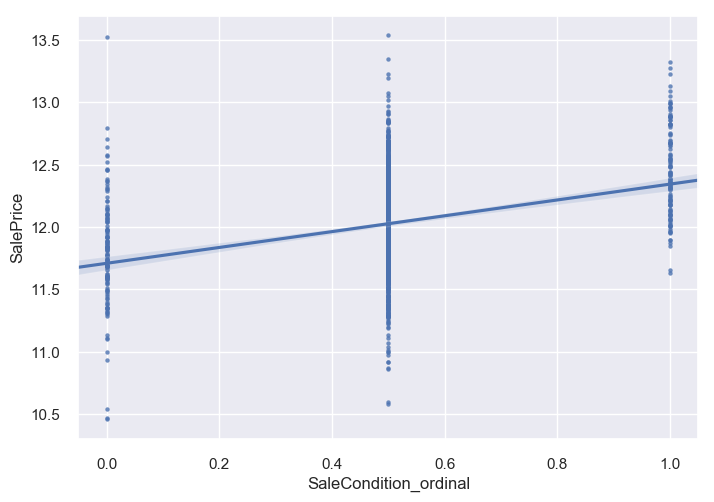

In [14]:
ax = sns.regplot(x='SaleCondition_ordinal', y='SalePrice', data=df, scatter_kws={"s": 10})

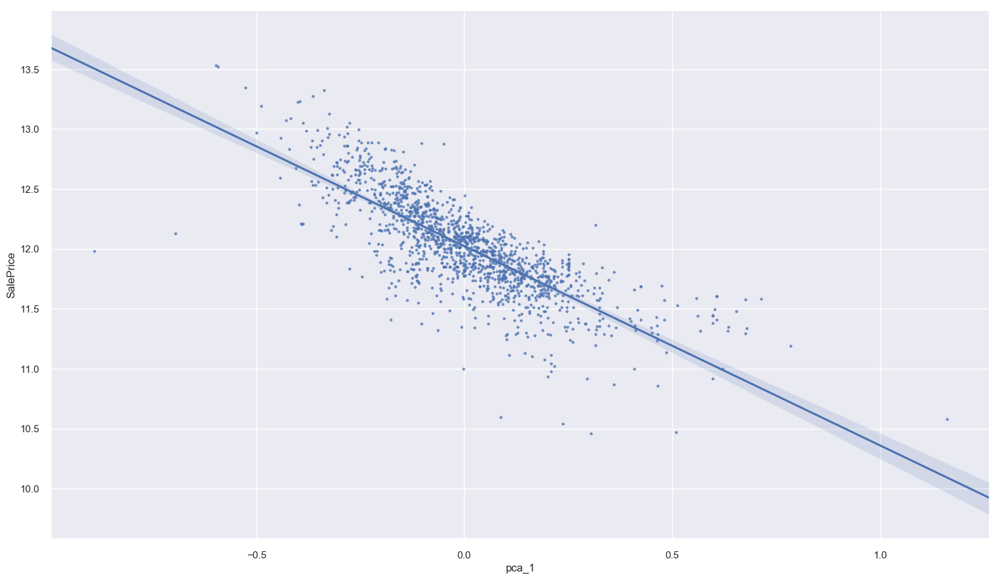

In [23]:
from sklearn.decomposition import PCA
pca = PCA(n_components=1)
df['pca_1'] = pca.fit_transform(df[['TotalArea','CoreArea','GrLivArea','LotArea','TotalBsmtSF']])
ax = sns.regplot(x='pca_1', y='SalePrice', data=df, scatter_kws={"s": 10})
ax.figure.set_size_inches(18.5, 10.5)

In [ ]:
from sklearn.decomposition import PCA
pca = PCA(n_components=1)
df['pca_1'] = pca.fit_transform(df[['GarageArea','TotalBsmtSF']])
ax = sns.regplot(x='pca_1', y='SalePrice', data=df, scatter_kws={"s": 10})

In [ ]:
pca = PCA(n_components=1)
df['house_characteritcs'] = pca.fit_transform(df[[
    'Neighborhood_ordinal',
    'MSSubClass_ordinal',
    'SaleType_ordinal',
    'SaleCondition_ordinal',
    'YearBuilt'
]])
ax = sns.regplot(x='pca_1', y='SalePrice', data=df, scatter_kws={"s": 10})

In [ ]:
pca = PCA(n_components=1)
df['pca_1'] = pca.fit_transform(df[['Neighborhood_ordinal','MSSubClass_ordinal','GrLivArea']])
ax = sns.regplot(x='pca_1', y='SalePrice', data=df, scatter_kws={"s": 10})

In [ ]:
    'MSSubClass_ordinal',   # 0.5
    'MasVnrType_ordinal',   # 0.4
    'Foundation_ordinal',   # 0.5 
    'SaleType_ordinal',     # 0.4
    'SaleCondition_ordinal',# 0.3